In [51]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [52]:
from pathlib import Path

import numpy as np
import torch

import quantem as em
from quantem.core import config
from quantem.core.datastructures import Dataset4dstem
from quantem.core.ml import CNN2d
from quantem.core.visualization import show_2d

from importlib.metadata import version # Temporary fix for version check
print(f"quantEM version: {version("quantem")}")

from quantem.diffractive_imaging import (
    PtychographyDatasetRaster,
    DetectorPixelated,
    ObjectDIP,
    ObjectPixelated,
    ProbeDIP,
    ProbePixelated,
    Ptychography,
)

quantEM version: 0.1.8


In [53]:
filepath = Path("/home/wdekleijne/git-repos/willem-playground/data/crystalline_20mrad_1.0e+04kev_1e+07-dose_3_layer_256x256.zip")
# filepath = Path("/home/wdekleijne/git-repos/willem-playground/data/crystalline_20mrad_1.0e+01kev_1e+12-dose_gpts_49_25_3_layer_256x256.zip")

# filepath = Path("/home/wdekleijne/git-repos/willem-playground/data/gold_20mrad_C10_C21_Nyquist.zip")

dset: Dataset4dstem = em.io.load(filepath)
print(dset)

quantem Dataset named 'DiffractionPatterns'
  shape: (49, 25, 256, 256)
  dtype: float32
  device: cpu
  origin: [0. 0. 0. 0.]
  sampling: [0.83333333 0.83333333 0.015625   0.015625  ]
  units: ['A', 'A', 'A^-1', 'A^-1']
  signal units: 'arb. units'


In [54]:
PROBE_ENERGY = 10e3 # eV
PROBE_SEMIANGLE = 20 # mrad
PROBE_DEFOCUS = 0 # A 

In [82]:
import matplotlib.pyplot as plt
pdset = PtychographyDatasetRaster.from_dataset4dstem(dset)
probe_params = {
    "energy": PROBE_ENERGY,
    "defocus": PROBE_DEFOCUS,
    "semiangle_cutoff": PROBE_SEMIANGLE,
}
pdset.preprocess(
    force_com_rotation=0,
    force_com_transpose=0,
    plot_com=False,
    probe_energy=PROBE_ENERGY,
    determine_disks=False,
)

obj_model_pix = ObjectPixelated.from_uniform( # also from_array and from_random 
    obj_type="complex",
    num_slices=1,
    # slice_thicknesses=3,
)

H, W = 160, 80  # match diffraction / probe grid

initial_obj = np.ones((1, H, W), dtype=np.complex64)

obj_model_pix = ObjectPixelated.from_array(
    initial_obj=initial_obj,
    obj_type="complex",
)

probe_params = {
    "energy": PROBE_ENERGY,
    "defocus": PROBE_DEFOCUS,
    "semiangle_cutoff": PROBE_SEMIANGLE,
}
probe_model_pix = ProbePixelated.from_params(
    probe_params=probe_params,
)

detector_model = DetectorPixelated()

Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to 0.


Normalizing intensities:   0%|          | 0/1225 [00:00<?, ?probe position/s]

torch.Size([1225, 256, 256])


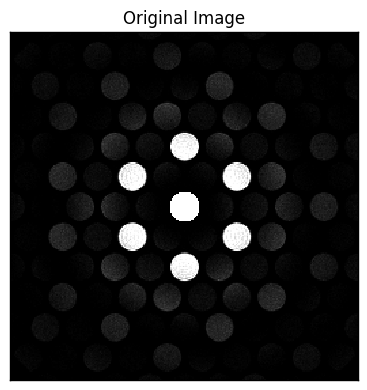

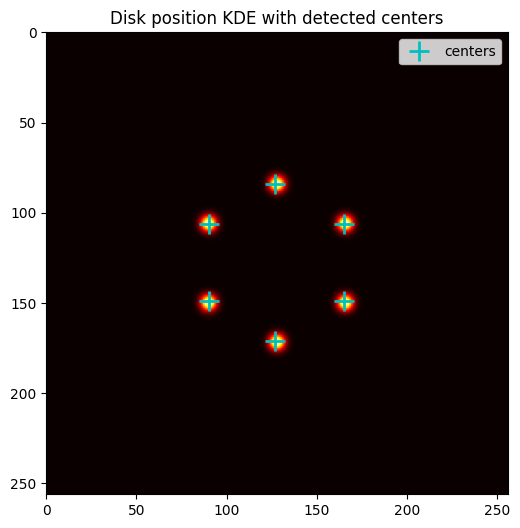

In [83]:
bragg_peaks = em.core.utils.imaging_utils.detect_bragg_disks(pdset, probe_params)

In [84]:
# tensorboard logging is optional 
from quantem.diffractive_imaging.logger_ptychography import LoggerPtychography

# logger = None
logger_pix = LoggerPtychography(
    log_dir = "./logs",
    run_prefix=dset.name,
    run_suffix="pix",
    log_images_every=10,
    log_probe_images=False,
)

ptycho_pix = Ptychography.from_models( 
    dset=pdset,
    obj_model=obj_model_pix,
    probe_model=probe_model_pix,
    detector_model=detector_model,
    logger=logger_pix,
    rng=42,
)

ptycho_pix.preprocess(
    obj_padding_px=(0, 0),
    val_ratio=0.0,
)

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

reconstruct: <quantem.diffractive_imaging.ptychography.Ptychography object at 0x774edafdc290>


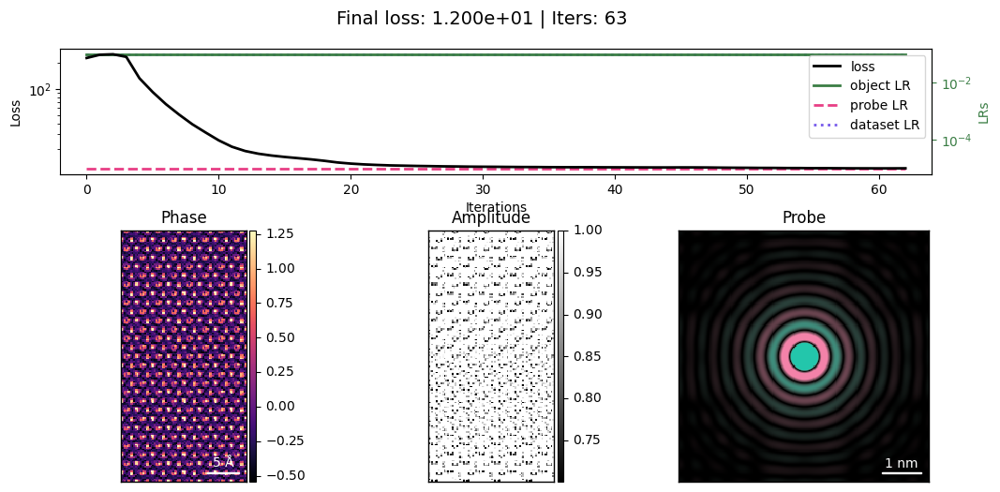

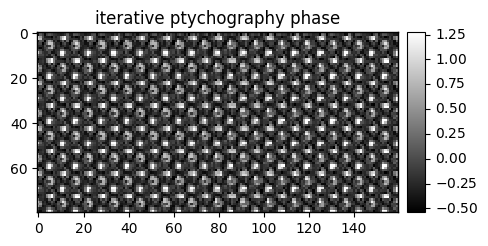

In [102]:
opt_params = {
        "object": {
            "type": "adamw", 
            "lr": 1e-1, 
        },
        "probe": {
            "type": "adamw", 
            "lr": 1e-5, 
        },
        "dataset": { ### for optimizing over descan shifts and probe positions
            "type": "adamw",
            "lr": 1e-1,
        }
}

scheduler_params = {
    "object": { ## scheduler kwargs are passed to the scheduler (of type type)
        "type": "plateau", ## i like plateau for many cases
        "factor":0.2,

    },
    "probe": {
        "type": "plateau",
        "factor":0.2,

    },
    "dataset": { 
        "type": "plateau",  ## exp is also frequently used 
        "factor":0.2,

    }
}

constraints = {
    "object": {
        "identical_slices": True,
        "positivity": True,
        "fix_potential_baseline": True,
        "fix_potential_baseline_factor": 0.1,  # tune between 0.05–0.5
        "gaussian_sigma": 0.3,      # was "gaussian_filter_sigma" + "gaussian_filter"
        "tv_weight_xy": 0.01,       # was "tv_denoise_weight" + "tv_denoise"
        # optionally also:
        # "q_lowpass": 0.3,         # low-pass frequency cutoff (0–1)
    },
    "dataset": {
        "center_scan_positions": True,
    }
}

constraints_stage1 = {
    "object": {
        "gaussian_sigma": 3.0,      # very heavy
        # "fix_potential_baseline": True,
        # "fix_potential_baseline_factor": 0.5,
        # "positivity": True,
    }
}
constraints_stage2 = {
    "object": {
        "gaussian_sigma": 0.1,
        "tv_weight_xy": 0.5,
        # "fix_potential_baseline": True,
        # "fix_potential_baseline_factor": 0.1,
        # "positivity": True,
    }
}
ptycho_pix_reconstruct = ptycho_pix.reconstruct(
    num_iters=3,
    reset=True,
    optimizer_params=opt_params,
    scheduler_params=scheduler_params,
    constraints=constraints_stage1, 
    batch_size=128,
    device="cuda:0",
    store_snapshots_every=1,
    autograd=False,
    autograd_random=False,
)
ptycho_pix_reconstruct = ptycho_pix.reconstruct(
    num_iters=60,
    reset=False,
    optimizer_params=opt_params,
    scheduler_params=scheduler_params,
    constraints=constraints_stage2, 
    batch_size=128,
    device="cuda:0",
    store_snapshots_every=1,
    autograd=False,
    autograd_random=False,
    disk_phase='mean'
)

print(f'reconstruct: {ptycho_pix_reconstruct}')

ptycho_pix_reconstruct.visualize()

em.visualization.show_2d(
    [
        [
            np.rot90(np.angle(ptycho_pix_reconstruct.obj[0]),k=1),
        ],
    ],
    title=[
        ["iterative ptychography phase"],
    ],
    axsize=(5,5),
    cbar=True,
    show_ticks=True
);



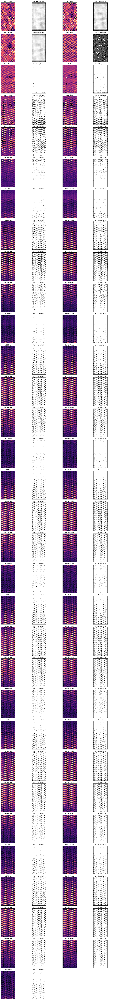

In [104]:
ptycho_pix_reconstruct.show_iters(
    show_probe=False,
    every_nth=1,
    cmap='magma',
)

In [67]:
print(pdset.intensities_4d.shape)

intensities_2d_ = pdset.intensities_4d.reshape(-1, *pdset.intensities_4d.shape[2:])

print(intensities_2d_.shape)

intensities_2d_250 = intensities_2d_[250]


(49, 25, 256, 256)
(1225, 256, 256)


In [68]:
import torch
import numpy as np
import matplotlib.pyplot as plt

# ── 0. Raw inputs you already have ───────────────────────────────────────────
# measured CBED pattern for scan point 250
measured = torch.tensor(intensities_2d_250, dtype=torch.float32)  # shape [H, W]
measured_amplitude = measured.sqrt()                               # targets are amplitudes

# initial probe (grab from the model before any reconstruction)
probe = ptycho_pix.probe_model.probe[0].detach().clone()       # shape [H, W], complex
# initial object patch (all ones for a fresh reset)
obj_patch = torch.ones_like(probe)                                 # shape [H, W], complex

print(f"probe shape: {probe.shape}, dtype: {probe.dtype}")
print(f"measured shape: {measured.shape}")

probe shape: torch.Size([256, 256]), dtype: torch.complex64
measured shape: torch.Size([256, 256])


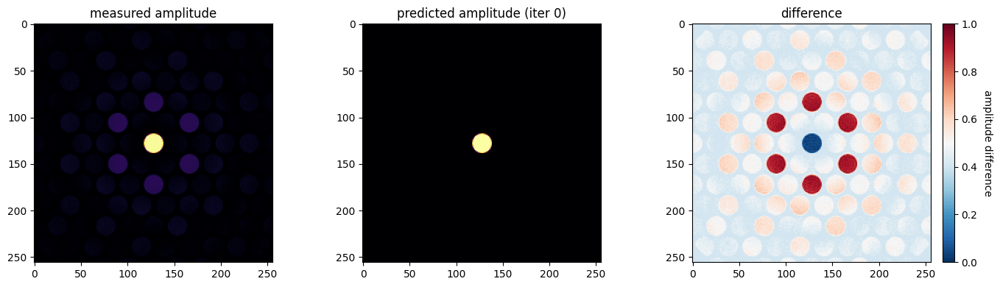

In [69]:

# ── 1. Forward: exit wave ─────────────────────────────────────────────────────
overlap = obj_patch * probe                                        # shape [H, W], complex

# ── 2. Forward: diffraction pattern ───────────────────────────────────────────
fourier_overlap = torch.fft.fft2(overlap, norm="ortho")           # corner-centered
fourier_overlap_shifted = torch.fft.fftshift(fourier_overlap)     # centered for display
pred_amplitude = fourier_overlap_shifted.abs()                    # predicted amplitude

# ── 3. Visualize forward ───────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(14, 4))
axes[0].set_title("measured amplitude")
axes[0].imshow(measured_amplitude.numpy(), cmap="inferno"); axes[0].axis("on")
axes[1].set_title("predicted amplitude (iter 0)")
axes[1].imshow(pred_amplitude.numpy(), cmap="inferno"); axes[1].axis("on")
axes[2].set_title("difference")
axes[2].imshow((measured_amplitude - pred_amplitude).numpy(), cmap="RdBu_r"); axes[2].axis("on")
cbar = fig.colorbar(plt.cm.ScalarMappable(cmap="RdBu_r"), ax=axes[2], fraction=0.046, pad=0.04)
cbar.set_label("amplitude difference", rotation=270, labelpad=15)
plt.tight_layout(); plt.show()

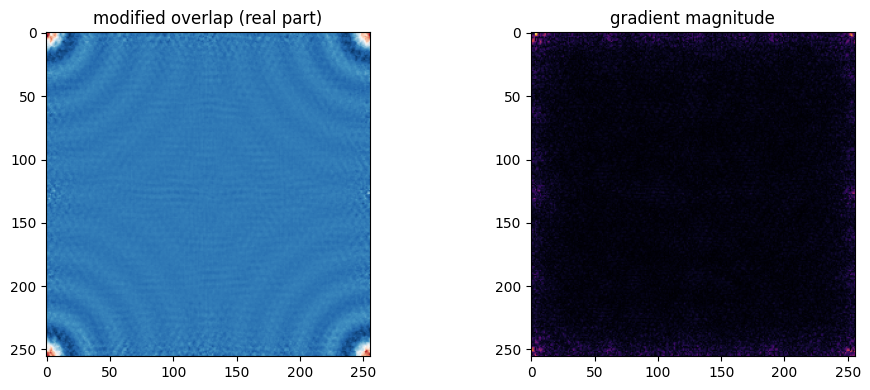

In [70]:
# ── 4. Fourier projection (the PIE/ePIE update rule) ─────────────────────────
# Replace the amplitude of fourier_overlap with the measured amplitude,
# keep the phase — this is the "projection onto the constraint set"
measured_amplitude_cornered = torch.fft.ifftshift(measured_amplitude)  # back to corner-centered

fourier_modified = measured_amplitude_cornered * torch.exp(
    1.0j * torch.angle(fourier_overlap)
)

# ── 5. Gradient (difference in real space) ────────────────────────────────────
modified_overlap = torch.fft.ifft2(fourier_modified, norm="ortho")     # back to real space
gradient = modified_overlap - overlap                                   # shape [H, W]

fig, axes = plt.subplots(1, 2, figsize=(10, 4))
axes[0].set_title("modified overlap (real part)")
axes[0].imshow(modified_overlap.real.numpy(), cmap="RdBu_r"); axes[0].axis("on")
axes[1].set_title("gradient magnitude")
axes[1].imshow(gradient.abs().numpy(), cmap="inferno"); axes[1].axis("on")
plt.tight_layout(); plt.show()

In [71]:
# ── 6. ePIE object update ─────────────────────────────────────────────────────
# ePIE update rule:
#   obj_new = obj + alpha * conj(probe) / |probe|^2_max * gradient
alpha = 1.0
probe_conj = probe.conj()
probe_max_sq = (probe.abs() ** 2).max()

obj_update = alpha * probe_conj / probe_max_sq * gradient
obj_patch_new = obj_patch + obj_update


In [72]:
# ── 7. ePIE probe update ──────────────────────────────────────────────────────
beta = 0
obj_conj = obj_patch.conj()
obj_max_sq = (obj_patch.abs() ** 2).max()

probe_update = beta * obj_conj / obj_max_sq * gradient
probe_new = probe + probe_update

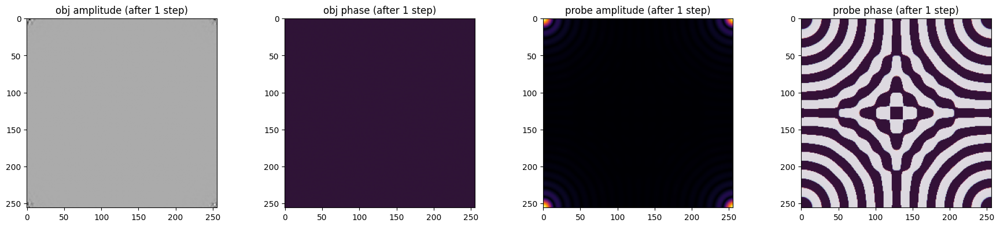

L2 loss (amplitude): 1.8890e+01
max obj update: 4.0760e-01
max probe update: 0.0000e+00


In [73]:
# ── 8. Visualize the updated object ───────────────────────────────────────────
fig, axes = plt.subplots(1, 4, figsize=(18, 4))
axes[0].set_title("obj amplitude (after 1 step)")
axes[0].imshow(obj_patch_new.abs().numpy(), cmap="gray"); axes[0].axis("on")
axes[1].set_title("obj phase (after 1 step)")
axes[1].imshow(obj_patch_new.angle().numpy(), cmap="twilight", vmin=-np.pi, vmax=np.pi); axes[1].axis("on")
axes[2].set_title("probe amplitude (after 1 step)")
axes[2].imshow(probe_new.abs().numpy(), cmap="inferno"); axes[2].axis("on")
axes[3].set_title("probe phase (after 1 step)")
axes[3].imshow(probe_new.angle().numpy(), cmap="twilight", vmin=-np.pi, vmax=np.pi); axes[3].axis("on")
plt.tight_layout(); plt.show()

print(f"L2 loss (amplitude): {((measured_amplitude - pred_amplitude)**2).mean().item():.4e}")
print(f"max obj update: {obj_update.abs().max().item():.4e}")
print(f"max probe update: {probe_update.abs().max().item():.4e}")

In [74]:
print(f"probe max intensity: {(probe.abs()**2).max().item():.4e}")
print(f"probe mean intensity: {(probe.abs()**2).mean().item():.4e}")
# ratio tells you how much the update is suppressed
print(f"suppression factor: {(probe.abs()**2).mean().item() / (probe.abs()**2).max().item():.4e}")

probe max intensity: 3.6085e+04
probe mean intensity: 1.0122e+02
suppression factor: 2.8051e-03


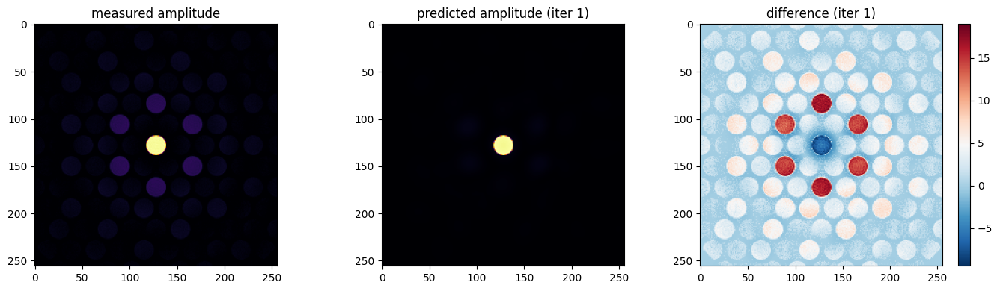

L2 loss iter 0: 1.8890e+01
L2 loss iter 1: 1.3371e+01
loss change:    -5.5183e+00  (improved)


In [75]:
# ── 9. Forward pass with updated obj and probe (iter 1) ───────────────────────
overlap_1 = obj_patch_new * probe_new
fourier_overlap_1 = torch.fft.fft2(overlap_1, norm="ortho")
pred_amplitude_1 = torch.fft.fftshift(fourier_overlap_1).abs()

fig, axes = plt.subplots(1, 3, figsize=(14, 4))
axes[0].set_title("measured amplitude")
axes[0].imshow(measured_amplitude.numpy(), cmap="inferno"); axes[0].axis("on")
axes[1].set_title("predicted amplitude (iter 1)")
axes[1].imshow(pred_amplitude_1.numpy(), cmap="inferno"); axes[1].axis("on")
axes[2].set_title("difference (iter 1)")
im = axes[2].imshow((measured_amplitude - pred_amplitude_1).numpy(), cmap="RdBu_r"); axes[2].axis("on")
plt.colorbar(im, ax=axes[2])
plt.tight_layout(); plt.show()

loss_0 = ((measured_amplitude - pred_amplitude) ** 2).mean().item()
loss_1 = ((measured_amplitude - pred_amplitude_1) ** 2).mean().item()
print(f"L2 loss iter 0: {loss_0:.4e}")
print(f"L2 loss iter 1: {loss_1:.4e}")
print(f"loss change:    {loss_1 - loss_0:.4e}  ({'improved' if loss_1 < loss_0 else 'worsened'})")

In [76]:
print(f"obj_patch_new max deviation from 1: {(obj_patch_new.abs() - 1.0).abs().max().item():.4e}")
print(f"probe_new vs probe max change:       {(probe_new - probe).abs().max().item():.4e}")
print(f"obj_max_sq was:   {obj_max_sq.item():.4e}")
print(f"probe_max_sq was: {probe_max_sq.item():.4e}")

obj_patch_new max deviation from 1: 4.0417e-01
probe_new vs probe max change:       0.0000e+00
obj_max_sq was:   1.0000e+00
probe_max_sq was: 3.6085e+04


n_scan: 1225, H: 256, W: 256
probe dtype: torch.complex64, obj dtype: torch.complex64
forward pass done, pred_amplitude_all shape: torch.Size([1225, 256, 256])
gradient_all max: 6.1608e+02


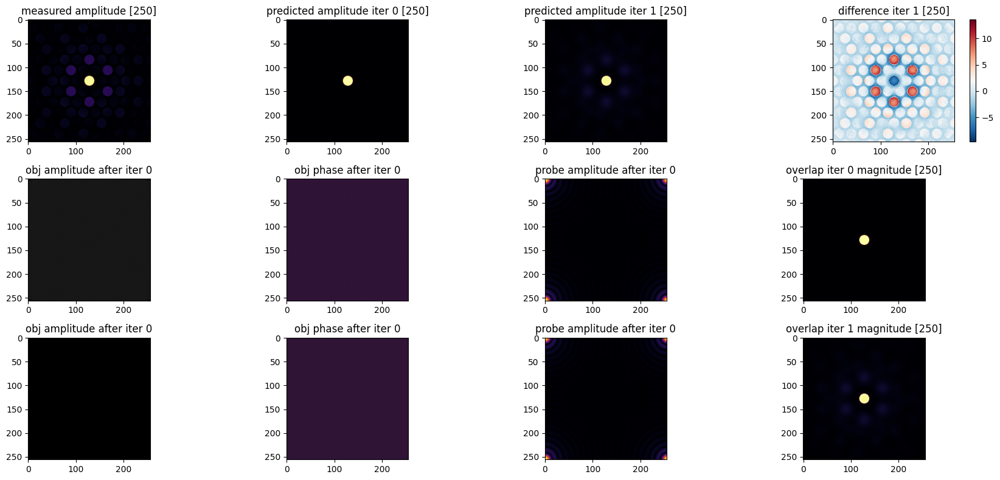

mean L2 loss iter 0: 1.8965e+01
mean L2 loss iter 1: 6.7655e+00
loss change: -1.2199e+01  (improved)


In [77]:
import torch
import numpy as np
import matplotlib.pyplot as plt

# ── 0. Raw inputs ─────────────────────────────────────────────────────────────
intensities_2d = pdset.intensities_4d.reshape(-1, *pdset.intensities_4d.shape[2:])
n_scan = intensities_2d.shape[0]                                   # e.g. 1225
H, W = intensities_2d.shape[-2], intensities_2d.shape[-1]

measured_amplitudes = torch.tensor(intensities_2d, dtype=torch.float32).sqrt()

probe = ptycho_pix.probe_model.probe[0].detach().clone()        # [H, W], complex
obj   = torch.ones(H, W, dtype=torch.complex64)                    # [H, W], ones

print(f"n_scan: {n_scan}, H: {H}, W: {W}")
print(f"probe dtype: {probe.dtype}, obj dtype: {obj.dtype}")

# ── 1. Forward pass over all scan points ─────────────────────────────────────
# For a single-slice, single-probe, no-position-shift case:
# overlap[i] = obj * probe  (same for all i since obj=ones and no position shifts)
# We still loop to keep it explicit and extensible

overlap_all = torch.zeros(n_scan, H, W, dtype=torch.complex64)
pred_amplitude_all = torch.zeros(n_scan, H, W)

for i in range(n_scan):
    overlap_i = obj * probe                                        # [H, W]
    fourier_i = torch.fft.fft2(overlap_i, norm="ortho")
    pred_amplitude_all[i] = torch.fft.fftshift(fourier_i).abs()
    overlap_all[i] = overlap_i

print(f"forward pass done, pred_amplitude_all shape: {pred_amplitude_all.shape}")

# ── 2. Fourier projection for all scan points (zero phase on iter 0) ──────────
fourier_overlap_all  = torch.fft.fft2(overlap_all, norm="ortho")  # [n_scan, H, W]
measured_cornered    = torch.fft.ifftshift(measured_amplitudes, dim=(-2,-1))

# zero-phase projection (the fix)
fourier_modified_all = measured_cornered * torch.ones_like(fourier_overlap_all)

# ── 3. Gradient for all scan points ───────────────────────────────────────────
modified_overlap_all = torch.fft.ifft2(fourier_modified_all, norm="ortho")  # [n_scan, H, W]
gradient_all = modified_overlap_all - overlap_all                            # [n_scan, H, W]

# ── 4. ePIE object update (accumulate over all scan points) ───────────────────
# In real ePIE each scan point updates a different patch of the object.
# Here obj=ones and no shifts, so we average the updates — this is the
# simplified "all scan points see the same object patch" case.
probe_conj    = probe.conj()                                       # [H, W]
probe_max_sq  = (probe.abs() ** 2).max()
alpha = 1.0
print(f'gradient_all max: {gradient_all.abs().max().item():.4e}')
obj_update_all = alpha * probe_conj / probe_max_sq * gradient_all  # [n_scan, H, W]
obj_update_mean = obj_update_all.mean(dim=0)                        # [H, W]
obj_new = obj + obj_update_mean

# ── 5. ePIE probe update (accumulate over all scan points) ────────────────────
obj_conj   = obj.conj()
obj_max_sq = (obj.abs() ** 2).max()
beta = 0.0

probe_update_all  = beta * obj_conj / obj_max_sq * gradient_all    # [n_scan, H, W]
probe_update_mean = probe_update_all.mean(dim=0)                    # [H, W]
probe_new = probe + probe_update_mean

# ── 6. Forward pass at iter 1 ─────────────────────────────────────────────────
overlap_1_all       = torch.zeros(n_scan, H, W, dtype=torch.complex64)
pred_amplitude_1_all = torch.zeros(n_scan, H, W)

for i in range(n_scan):
    overlap_i = obj_new * probe_new
    fourier_i = torch.fft.fft2(overlap_i, norm="ortho")
    pred_amplitude_1_all[i] = torch.fft.fftshift(fourier_i).abs()
    overlap_1_all[i] = overlap_i

# ── 7. Inspect scan point 250 ─────────────────────────────────────────────────
idx = 250

fig, axes = plt.subplots(3, 4, figsize=(18, 8))

axes[0,0].set_title("measured amplitude [250]")
axes[0,0].imshow(measured_amplitudes[idx].numpy(), cmap="inferno")

axes[0,1].set_title("predicted amplitude iter 0 [250]")
axes[0,1].imshow(pred_amplitude_all[idx].numpy(), cmap="inferno")

axes[0,2].set_title("predicted amplitude iter 1 [250]")
axes[0,2].imshow(pred_amplitude_1_all[idx].numpy(), cmap="inferno")

diff = measured_amplitudes[idx] - pred_amplitude_1_all[idx]
im = axes[0,3].imshow(diff.numpy(), cmap="RdBu_r")
axes[0,3].set_title("difference iter 1 [250]")
plt.colorbar(im, ax=axes[0,3])

axes[1,0].set_title("obj amplitude after iter 0")
axes[1,0].imshow(obj_new.abs().numpy(), cmap="gray")

axes[1,1].set_title("obj phase after iter 0")
axes[1,1].imshow(obj_new.angle().numpy(), cmap="twilight", vmin=-np.pi, vmax=np.pi)

axes[1,2].set_title("probe amplitude after iter 0")
axes[1,2].imshow(probe_new.abs().numpy(), cmap="inferno")

axes[1,3].set_title("overlap iter 0 magnitude [250]")
axes[1,3].imshow(torch.fft.fftshift(torch.fft.fft2(overlap_all[idx])).abs().numpy(), cmap="inferno")

axes[2,0].set_title("obj amplitude after iter 0")
axes[2,0].imshow(obj.abs().numpy(), cmap="gray")

axes[2,1].set_title("obj phase after iter 0")
axes[2,1].imshow(obj.angle().numpy(), cmap="twilight", vmin=-np.pi, vmax=np.pi)

axes[2,2].set_title("probe amplitude after iter 0")
axes[2,2].imshow(probe.abs().numpy(), cmap="inferno")

axes[2,3].set_title("overlap iter 1 magnitude [250]")
axes[2,3].imshow(torch.fft.fftshift(torch.fft.fft2(overlap_1_all[idx])).abs().numpy(), cmap="inferno")

for ax in axes.flat:
    ax.axis("on")
plt.tight_layout()
plt.show()

# ── 8. Loss summary ───────────────────────────────────────────────────────────
loss_0 = ((measured_amplitudes - pred_amplitude_all  )**2).mean().item()
loss_1 = ((measured_amplitudes - pred_amplitude_1_all)**2).mean().item()
print(f"mean L2 loss iter 0: {loss_0:.4e}")
print(f"mean L2 loss iter 1: {loss_1:.4e}")
print(f"loss change: {loss_1 - loss_0:.4e}  ({'improved' if loss_1 < loss_0 else 'worsened'})")

In [78]:
print(probe.shape)  # probably [1, 256, 256] instead of [256, 256]
print(f"probe_max_sq: {probe_max_sq.item():.4e}")
print(f"probe mean sq: {(probe.abs()**2).mean().item():.4e}")
probe_max_sq = (probe.abs() ** 2).max()        # current — very large
probe_denom  = (probe.abs() ** 2).mean()        # better — less suppression
print(f"measured_amplitudes max: {measured_amplitudes.max().item():.4e}")
print(f"pred_amplitude_all max:  {pred_amplitude_all.max().item():.4e}")

torch.Size([256, 256])
probe_max_sq: 3.6085e+04
probe mean sq: 1.0122e+02
measured_amplitudes max: 1.3037e+02
pred_amplitude_all max:  1.4039e+02


In [79]:
print(f"obj_patch_new max deviation from 1: {(obj_patch_new.abs() - 1.0).abs().max().item():.4e}")
print(f"probe_new vs probe max change:       {(probe_new - probe).abs().max().item():.4e}")
print(f"obj_max_sq was:   {obj_max_sq.item():.4e}")
print(f"probe_max_sq was: {probe_max_sq.item():.4e}")

obj_patch_new max deviation from 1: 4.0417e-01
probe_new vs probe max change:       0.0000e+00
obj_max_sq was:   1.0000e+00
probe_max_sq was: 3.6085e+04


n_scan: 1225, H: 256, W: 256
iter 001/10  loss: 1.8965e+01
iter 002/10  loss: 4.0822e+00
iter 003/10  loss: 1.8040e+00
iter 004/10  loss: 9.7512e-01
iter 005/10  loss: 5.9620e-01
iter 006/10  loss: 4.2394e-01
iter 007/10  loss: 3.4513e-01
iter 008/10  loss: 3.0895e-01
iter 009/10  loss: 2.9230e-01
iter 010/10  loss: 2.8463e-01


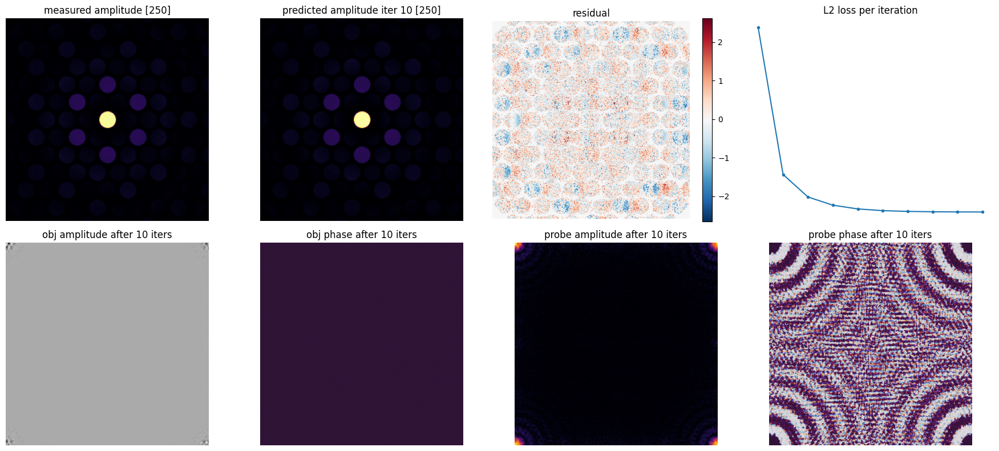

In [80]:
import torch
import numpy as np
import matplotlib.pyplot as plt

# ── 0. Raw inputs ─────────────────────────────────────────────────────────────
intensities_2d = pdset.intensities_4d.reshape(-1, *pdset.intensities_4d.shape[2:])
n_scan = intensities_2d.shape[0]
H, W   = intensities_2d.shape[-2], intensities_2d.shape[-1]

measured_amplitudes = torch.tensor(intensities_2d, dtype=torch.float32).sqrt()
measured_cornered   = torch.fft.ifftshift(measured_amplitudes, dim=(-2, -1))  # precompute once

probe = ptycho_pix.probe_model.probe[0].detach().clone()
obj   = torch.ones(H, W, dtype=torch.complex64)

alpha      = 1.0   # object step size
beta       = 0.5   # probe step size (0 = freeze probe)
n_iter     = 10    # number of full passes over all scan points
log_every  = 1     # print loss every N iterations

print(f"n_scan: {n_scan}, H: {H}, W: {W}")

# ── 1. Helper: one forward + Fourier projection for all scan points ───────────
def epie_step(obj, probe, measured_cornered, alpha, beta):
    """One full pass (all scan points, batch-averaged) of simplified ePIE.
    Returns updated obj, probe, and mean L2 loss."""

    # Forward: all scan points see the same obj*probe (no position shifts)
    exit_wave = obj * probe                                   # [H, W]
    F_pred    = torch.fft.fft2(exit_wave, norm="ortho")      # [H, W]

    # Fourier projection: keep predicted phase, replace amplitude with measured
    eps     = 1e-8
    phase   = F_pred / (F_pred.abs() + eps)                  # unit phasor [H, W]

    # Each scan point has its own measured amplitude → broadcast over n_scan
    F_mod   = measured_cornered * phase.unsqueeze(0)          # [n_scan, H, W]
    exit_new = torch.fft.ifft2(F_mod, norm="ortho")          # [n_scan, H, W]

    delta   = exit_new - exit_wave.unsqueeze(0)               # [n_scan, H, W]

    # Object update (averaged over scan points)
    probe_max_sq  = probe.abs().pow(2).max() + eps
    obj_update    = (alpha * probe.conj() / probe_max_sq * delta).mean(0)
    obj_new       = obj + obj_update

    # Probe update (averaged over scan points)
    obj_max_sq    = obj.abs().pow(2).max() + eps
    probe_update  = (beta  * obj.conj()   / obj_max_sq   * delta).mean(0)
    probe_new     = probe + probe_update

    # Loss: compare predicted amplitude (fftshifted) to measured
    pred_amp = torch.fft.fftshift(F_pred.unsqueeze(0).expand_as(measured_cornered),
                                   dim=(-2, -1)).abs()
    # measured_cornered is in corner layout; shift back for loss
    measured_shifted = torch.fft.fftshift(measured_cornered, dim=(-2, -1))
    loss = ((measured_shifted - pred_amp) ** 2).mean().item()

    return obj_new, probe_new, loss

# ── 2. Iteration loop ─────────────────────────────────────────────────────────
loss_history = []

for it in range(n_iter):
    obj, probe, loss = epie_step(obj, probe, measured_cornered, alpha, beta)
    loss_history.append(loss)
    if it % log_every == 0:
        print(f"iter {it+1:03d}/{n_iter}  loss: {loss:.4e}")

# ── 3. Visualise final state ──────────────────────────────────────────────────
idx = 250

exit_vis = obj * probe
F_vis    = torch.fft.fft2(exit_vis, norm="ortho")
pred_amp_final = torch.fft.fftshift(F_vis).abs().detach()
measured_vis   = torch.fft.fftshift(measured_cornered[idx], dim=(-2, -1))

fig, axes = plt.subplots(2, 4, figsize=(18, 8))

axes[0,0].imshow(measured_vis.numpy(), cmap="inferno")
axes[0,0].set_title(f"measured amplitude [{idx}]")

axes[0,1].imshow(pred_amp_final.numpy(), cmap="inferno")
axes[0,1].set_title(f"predicted amplitude iter {n_iter} [{idx}]")

diff = measured_vis - pred_amp_final
im = axes[0,2].imshow(diff.numpy(), cmap="RdBu_r")
axes[0,2].set_title("residual")
plt.colorbar(im, ax=axes[0,2])

axes[0,3].plot(loss_history, marker="o", markersize=3)
axes[0,3].set_title("L2 loss per iteration")
axes[0,3].set_xlabel("iteration")
axes[0,3].set_ylabel("mean L2")

axes[1,0].imshow(obj.abs().detach().numpy(), cmap="gray")
axes[1,0].set_title(f"obj amplitude after {n_iter} iters")

axes[1,1].imshow(obj.angle().detach().numpy(), cmap="twilight", vmin=-np.pi, vmax=np.pi)
axes[1,1].set_title(f"obj phase after {n_iter} iters")

axes[1,2].imshow(probe.abs().detach().numpy(), cmap="inferno")
axes[1,2].set_title(f"probe amplitude after {n_iter} iters")

axes[1,3].imshow(probe.angle().detach().numpy(), cmap="twilight", vmin=-np.pi, vmax=np.pi)
axes[1,3].set_title(f"probe phase after {n_iter} iters")

for ax in axes.flat:
    ax.axis("off")
plt.tight_layout()
plt.show()

In [81]:
# Run these to find your scan positions
print(type(pdset))
print([a for a in dir(pdset) if not a.startswith('_')])

# Check the 4D shape — likely [n_rows, n_cols, H, W]
print("intensities_4d shape:", pdset.intensities_4d.shape)

# Check ptycho_pix
print([a for a in dir(ptycho_pix) if not a.startswith('_')])
for attr in ['positions', 'positions_px', 'probe_positions', 'scan_positions', 
             'R_Å', 'R_pixel', 'positions_ang']:
    if hasattr(ptycho_pix, attr):
        v = getattr(ptycho_pix, attr)
        print(f"  ptycho_pix.{attr}: shape={getattr(v,'shape',None)}, dtype={getattr(v,'dtype',None)}")

<class 'quantem.diffractive_imaging.dataset_models.PtychographyDatasetRaster'>
['DEFAULT_CONSTRAINTS', 'DEFAULT_LRS', 'DEFAULT_OPTIMIZER_TYPE', 'T_destination', 'accumulate_constraint_losses', 'add_constraint', 'add_module', 'add_soft_constraint_loss', 'amplitudes', 'apply', 'apply_descan_constraints', 'apply_hard_constraints', 'apply_soft_constraints', 'bfloat16', 'buffers', 'call_super_init', 'centered_amplitudes', 'centered_intensities', 'children', 'com_fit', 'com_measured', 'com_normalized', 'com_rotation_rad', 'com_transpose', 'compile', 'constraints', 'cpu', 'cuda', 'descan_shifts', 'detector_mask', 'detector_sampling', 'detector_units', 'device', 'diffraction_padding', 'disk_positions', 'double', 'dset', 'dset_disks', 'dump_patches', 'eval', 'extra_repr', 'float', 'forward', 'fov', 'from_array', 'from_dataset4dstem', 'from_file', 'get_buffer', 'get_current_lr', 'get_descan_tv_loss', 'get_extra_state', 'get_iter_constraint_losses', 'get_optimization_parameters', 'get_parameter',

In [82]:
pdset.scan_sampling

array([0.8333333, 0.8333333], dtype=float32)

1
304
Probe: 256×256, step: 1×1 px
Object canvas: 304×280
n_scan: 1225
iter 001/5  loss: 3.9067e-01
iter 002/5  loss: 3.6391e-01
iter 003/5  loss: 3.6337e-01
iter 004/5  loss: 3.6208e-01
iter 005/5  loss: 3.6207e-01


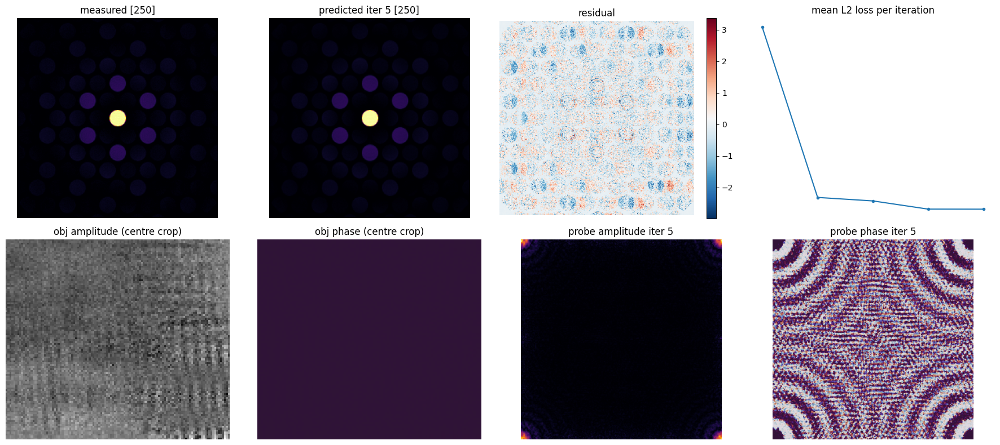

In [83]:
import torch
import numpy as np
import matplotlib.pyplot as plt

# ── 0. Raw inputs ─────────────────────────────────────────────────────────────
intensities_4d = pdset.intensities_4d                          # [n_rows, n_cols, H, W]
n_rows, n_cols = intensities_4d.shape[:2]
H, W           = intensities_4d.shape[2], intensities_4d.shape[3]
n_scan         = n_rows * n_cols

measured_amplitudes = torch.tensor(
    intensities_4d.reshape(n_scan, H, W), dtype=torch.float32
).sqrt()

probe = ptycho_pix.probe_model.probe[0].detach().clone()       # [H, W], complex

# ── 1. Build scan positions from the raster grid ──────────────────────────────
# step_r / step_c = how many pixels the beam moves between scan points.
# For ~70% overlap: step ≈ 0.3 * probe_size.
# Change these if you know the real calibrated step size.
step_r = 1
step_c = 1

print(step_r)

# Object canvas large enough to hold all shifted patches
obj_H = (n_rows - 1) * step_r + H
obj_W = (n_cols - 1) * step_c + W

print(obj_H)
obj   = torch.ones(int(obj_H), int(obj_W), dtype=torch.complex64)

# Scan positions as (row_offset, col_offset) pixel indices into obj
positions = [(r * step_r, c * step_c) for r in range(n_rows) for c in range(n_cols)]

print(f"Probe: {H}×{W}, step: {step_r}×{step_c} px")
print(f"Object canvas: {obj_H}×{obj_W}")
print(f"n_scan: {n_scan}")

# ── 2. Helpers ────────────────────────────────────────────────────────────────
EPS = 1e-8

def fourier_project(exit_wave, measured_amp_corner):
    """Replace Fourier amplitude with measured, keep predicted phase."""
    F      = torch.fft.fft2(exit_wave, norm="ortho")
    phase  = F / (F.abs() + EPS)
    return torch.fft.ifft2(measured_amp_corner * phase, norm="ortho"), F

# ── 3. Iterative ePIE with real position shifts ───────────────────────────────
alpha      = 1.0
beta       = 0.5
n_iter     = 5
log_every  = 1

loss_history = []

for it in range(n_iter):
    order      = torch.randperm(n_scan)   # random scan order per iteration
    iter_loss  = 0.0

    for k in order:
        k       = k.item()
        r0, c0  = positions[k]

        # Extract object patch
        obj_patch = obj[r0:r0+H, c0:c0+W]                    # [H, W]

        # Exit wave and Fourier projection
        exit_wave      = obj_patch * probe
        measured_corn  = torch.fft.ifftshift(measured_amplitudes[k])
        exit_new, F    = fourier_project(exit_wave, measured_corn)

        delta = exit_new - exit_wave                           # [H, W]

        # Object update (in-place on canvas patch)
        probe_max_sq = probe.abs().pow(2).max() + EPS
        obj[r0:r0+H, c0:c0+W] = obj_patch + alpha * probe.conj() / probe_max_sq * delta

        # Probe update
        patch_max_sq = obj_patch.abs().pow(2).max() + EPS
        probe        = probe + beta * obj_patch.conj() / patch_max_sq * delta

        # Loss for this scan point
        pred_amp   = torch.fft.fftshift(F).abs()
        iter_loss += ((measured_amplitudes[k] - pred_amp) ** 2).mean().item()

    loss_history.append(iter_loss / n_scan)
    if it % log_every == 0:
        print(f"iter {it+1:03d}/{n_iter}  loss: {loss_history[-1]:.4e}")

# ── 4. Visualise ──────────────────────────────────────────────────────────────
idx   = 250
r0, c0 = positions[idx]
exit_vis    = obj[r0:r0+H, c0:c0+W] * probe
F_vis       = torch.fft.fft2(exit_vis, norm="ortho")
pred_final  = torch.fft.fftshift(F_vis).abs().detach()

# Crop centre of object for display
cx, cy = obj_H // 2, obj_W // 2
pad    = max(H, W)
obj_crop = obj[cx-pad:cx+pad, cy-pad:cy+pad]

fig, axes = plt.subplots(2, 4, figsize=(18, 8))

axes[0,0].imshow(measured_amplitudes[idx].numpy(), cmap="inferno")
axes[0,0].set_title(f"measured [{idx}]")

axes[0,1].imshow(pred_final.numpy(), cmap="inferno")
axes[0,1].set_title(f"predicted iter {n_iter} [{idx}]")

diff = measured_amplitudes[idx] - pred_final
im   = axes[0,2].imshow(diff.numpy(), cmap="RdBu_r")
axes[0,2].set_title("residual")
plt.colorbar(im, ax=axes[0,2])

axes[0,3].plot(loss_history, marker="o", markersize=3)
axes[0,3].set_title("mean L2 loss per iteration")
axes[0,3].set_xlabel("iteration")

axes[1,0].imshow(obj_crop.abs().detach().numpy(), cmap="gray")
axes[1,0].set_title("obj amplitude (centre crop)")

axes[1,1].imshow(obj_crop.angle().detach().numpy(), cmap="twilight", vmin=-np.pi, vmax=np.pi)
axes[1,1].set_title("obj phase (centre crop)")

axes[1,2].imshow(probe.abs().detach().numpy(), cmap="inferno")
axes[1,2].set_title(f"probe amplitude iter {n_iter}")

axes[1,3].imshow(probe.angle().detach().numpy(), cmap="twilight", vmin=-np.pi, vmax=np.pi)
axes[1,3].set_title(f"probe phase iter {n_iter}")

for ax in axes.flat:
    ax.axis("off")
plt.tight_layout()
plt.show()

1
304
Probe: 256×256, step: 1×1 px
Object canvas: 304×280
n_scan: 1225


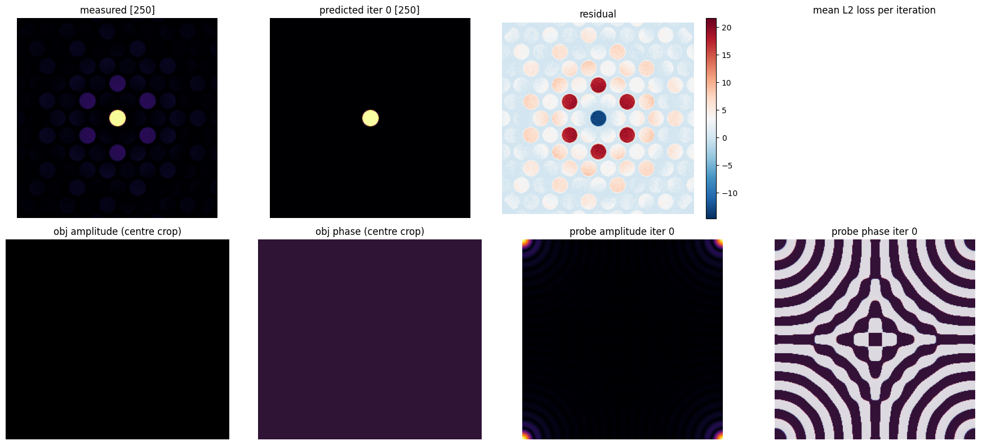

In [84]:
import torch
import numpy as np
import matplotlib.pyplot as plt

# ── 0. Raw inputs ─────────────────────────────────────────────────────────────
intensities_4d = pdset.intensities_4d                          # [n_rows, n_cols, H, W]
n_rows, n_cols = intensities_4d.shape[:2]
H, W           = intensities_4d.shape[2], intensities_4d.shape[3]
n_scan         = n_rows * n_cols

measured_amplitudes = torch.tensor(
    intensities_4d.reshape(n_scan, H, W), dtype=torch.float32
).sqrt()

probe = ptycho_pix.probe_model.probe[0].detach().clone()       # [H, W], complex

# ── 1. Build scan positions from the raster grid ──────────────────────────────
# step_r / step_c = how many pixels the beam moves between scan points.
# For ~70% overlap: step ≈ 0.3 * probe_size.
# Change these if you know the real calibrated step size.
step_r = 1
step_c = 1

print(step_r)

# Object canvas large enough to hold all shifted patches
obj_H = (n_rows - 1) * step_r + H
obj_W = (n_cols - 1) * step_c + W

print(obj_H)
obj   = torch.ones(int(obj_H), int(obj_W), dtype=torch.complex64)

# Scan positions as (row_offset, col_offset) pixel indices into obj
positions = [(r * step_r, c * step_c) for r in range(n_rows) for c in range(n_cols)]

print(f"Probe: {H}×{W}, step: {step_r}×{step_c} px")
print(f"Object canvas: {obj_H}×{obj_W}")
print(f"n_scan: {n_scan}")

# ── 2. Helpers ────────────────────────────────────────────────────────────────
EPS = 1e-8

def fourier_project(exit_wave, measured_amp_corner):
    """Replace Fourier amplitude with measured, keep predicted phase."""
    F      = torch.fft.fft2(exit_wave, norm="ortho")
    phase  = F / (F.abs() + EPS)
    return torch.fft.ifft2(measured_amp_corner * phase, norm="ortho"), F

# ── 3. Iterative ePIE with real position shifts ───────────────────────────────
alpha      = 1.0
beta       = 0.5
n_iter     = 0
log_every  = 1

loss_history = []

for it in range(n_iter):
    order      = torch.randperm(n_scan)   # random scan order per iteration
    iter_loss  = 0.0

    for k in order:
        k       = k.item()
        r0, c0  = positions[k]

        # Extract object patch
        obj_patch = obj[r0:r0+H, c0:c0+W]                    # [H, W]

        # Exit wave and Fourier projection
        exit_wave      = obj_patch * probe
        measured_corn  = torch.fft.ifftshift(measured_amplitudes[k])
        exit_new, F    = fourier_project(exit_wave, measured_corn)

        delta = exit_new - exit_wave                           # [H, W]

        # Object update (in-place on canvas patch)
        probe_max_sq = probe.abs().pow(2).max() + EPS
        obj[r0:r0+H, c0:c0+W] = obj_patch + alpha * probe.conj() / probe_max_sq * delta

        # Probe update
        patch_max_sq = obj_patch.abs().pow(2).max() + EPS
        probe        = probe + beta * obj_patch.conj() / patch_max_sq * delta

        # Loss for this scan point
        pred_amp   = torch.fft.fftshift(F).abs()
        iter_loss += ((measured_amplitudes[k] - pred_amp) ** 2).mean().item()

    loss_history.append(iter_loss / n_scan)
    if it % log_every == 0:
        print(f"iter {it+1:03d}/{n_iter}  loss: {loss_history[-1]:.4e}")

# ── 4. Visualise ──────────────────────────────────────────────────────────────
idx   = 250
r0, c0 = positions[idx]
exit_vis    = obj[r0:r0+H, c0:c0+W] * probe
F_vis       = torch.fft.fft2(exit_vis, norm="ortho")
pred_final  = torch.fft.fftshift(F_vis).abs().detach()

# Crop centre of object for display
cx, cy = obj_H // 2, obj_W // 2
pad    = max(H, W)
obj_crop = obj[cx-pad:cx+pad, cy-pad:cy+pad]

fig, axes = plt.subplots(2, 4, figsize=(18, 8))

axes[0,0].imshow(measured_amplitudes[idx].numpy(), cmap="inferno")
axes[0,0].set_title(f"measured [{idx}]")

axes[0,1].imshow(pred_final.numpy(), cmap="inferno")
axes[0,1].set_title(f"predicted iter {n_iter} [{idx}]")

diff = measured_amplitudes[idx] - pred_final
im   = axes[0,2].imshow(diff.numpy(), cmap="RdBu_r")
axes[0,2].set_title("residual")
plt.colorbar(im, ax=axes[0,2])

axes[0,3].plot(loss_history, marker="o", markersize=3)
axes[0,3].set_title("mean L2 loss per iteration")
axes[0,3].set_xlabel("iteration")

axes[1,0].imshow(obj_crop.abs().detach().numpy(), cmap="gray")
axes[1,0].set_title("obj amplitude (centre crop)")

axes[1,1].imshow(obj_crop.angle().detach().numpy(), cmap="twilight", vmin=-np.pi, vmax=np.pi)
axes[1,1].set_title("obj phase (centre crop)")

axes[1,2].imshow(probe.abs().detach().numpy(), cmap="inferno")
axes[1,2].set_title(f"probe amplitude iter {n_iter}")

axes[1,3].imshow(probe.angle().detach().numpy(), cmap="twilight", vmin=-np.pi, vmax=np.pi)
axes[1,3].set_title(f"probe phase iter {n_iter}")

for ax in axes.flat:
    ax.axis("off")
plt.tight_layout()
plt.show()

1
304
Probe: 256×256, step: 1×1 px
Object canvas: 304×280
n_scan: 1225
iter 001/1  loss: 3.9075e-01


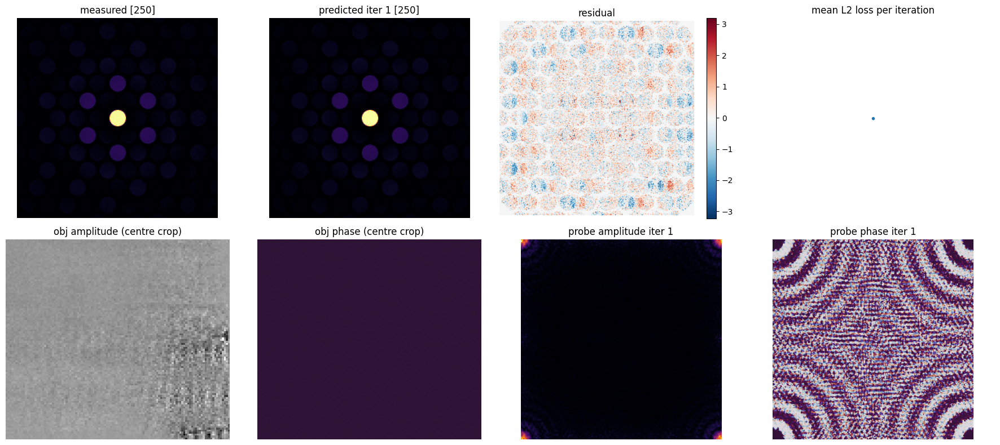

In [85]:
import torch
import numpy as np
import matplotlib.pyplot as plt

# ── 0. Raw inputs ─────────────────────────────────────────────────────────────
intensities_4d = pdset.intensities_4d                          # [n_rows, n_cols, H, W]
n_rows, n_cols = intensities_4d.shape[:2]
H, W           = intensities_4d.shape[2], intensities_4d.shape[3]
n_scan         = n_rows * n_cols

measured_amplitudes = torch.tensor(
    intensities_4d.reshape(n_scan, H, W), dtype=torch.float32
).sqrt()

probe = ptycho_pix.probe_model.probe[0].detach().clone()       # [H, W], complex

# ── 1. Build scan positions from the raster grid ──────────────────────────────
# step_r / step_c = how many pixels the beam moves between scan points.
# For ~70% overlap: step ≈ 0.3 * probe_size.
# Change these if you know the real calibrated step size.
step_r = 1
step_c = 1

print(step_r)

# Object canvas large enough to hold all shifted patches
obj_H = (n_rows - 1) * step_r + H
obj_W = (n_cols - 1) * step_c + W

print(obj_H)
obj   = torch.ones(int(obj_H), int(obj_W), dtype=torch.complex64)

# Scan positions as (row_offset, col_offset) pixel indices into obj
positions = [(r * step_r, c * step_c) for r in range(n_rows) for c in range(n_cols)]

print(f"Probe: {H}×{W}, step: {step_r}×{step_c} px")
print(f"Object canvas: {obj_H}×{obj_W}")
print(f"n_scan: {n_scan}")

# ── 2. Helpers ────────────────────────────────────────────────────────────────
EPS = 1e-8

def fourier_project(exit_wave, measured_amp_corner):
    """Replace Fourier amplitude with measured, keep predicted phase."""
    F      = torch.fft.fft2(exit_wave, norm="ortho")
    phase  = F / (F.abs() + EPS)
    return torch.fft.ifft2(measured_amp_corner * phase, norm="ortho"), F

# ── 3. Iterative ePIE with real position shifts ───────────────────────────────
alpha      = 1.0
beta       = 0.5
n_iter     = 1
log_every  = 1

loss_history = []

for it in range(n_iter):
    order      = torch.randperm(n_scan)   # random scan order per iteration
    iter_loss  = 0.0

    for k in order:
        k       = k.item()
        r0, c0  = positions[k]

        # Extract object patch
        obj_patch = obj[r0:r0+H, c0:c0+W]                    # [H, W]

        # Exit wave and Fourier projection
        exit_wave      = obj_patch * probe
        measured_corn  = torch.fft.ifftshift(measured_amplitudes[k])
        exit_new, F    = fourier_project(exit_wave, measured_corn)

        delta = exit_new - exit_wave                           # [H, W]

        # Object update (in-place on canvas patch)
        probe_max_sq = probe.abs().pow(2).max() + EPS
        obj[r0:r0+H, c0:c0+W] = obj_patch + alpha * probe.conj() / probe_max_sq * delta

        # Probe update
        patch_max_sq = obj_patch.abs().pow(2).max() + EPS
        probe        = probe + beta * obj_patch.conj() / patch_max_sq * delta

        # Loss for this scan point
        pred_amp   = torch.fft.fftshift(F).abs()
        iter_loss += ((measured_amplitudes[k] - pred_amp) ** 2).mean().item()

    loss_history.append(iter_loss / n_scan)
    if it % log_every == 0:
        print(f"iter {it+1:03d}/{n_iter}  loss: {loss_history[-1]:.4e}")

# ── 4. Visualise ──────────────────────────────────────────────────────────────
idx   = 250
r0, c0 = positions[idx]
exit_vis    = obj[r0:r0+H, c0:c0+W] * probe
F_vis       = torch.fft.fft2(exit_vis, norm="ortho")
pred_final  = torch.fft.fftshift(F_vis).abs().detach()

# Crop centre of object for display
cx, cy = obj_H // 2, obj_W // 2
pad    = max(H, W)
obj_crop = obj[cx-pad:cx+pad, cy-pad:cy+pad]

fig, axes = plt.subplots(2, 4, figsize=(18, 8))

axes[0,0].imshow(measured_amplitudes[idx].numpy(), cmap="inferno")
axes[0,0].set_title(f"measured [{idx}]")

axes[0,1].imshow(pred_final.numpy(), cmap="inferno")
axes[0,1].set_title(f"predicted iter {n_iter} [{idx}]")

diff = measured_amplitudes[idx] - pred_final
im   = axes[0,2].imshow(diff.numpy(), cmap="RdBu_r")
axes[0,2].set_title("residual")
plt.colorbar(im, ax=axes[0,2])

axes[0,3].plot(loss_history, marker="o", markersize=3)
axes[0,3].set_title("mean L2 loss per iteration")
axes[0,3].set_xlabel("iteration")

axes[1,0].imshow(obj_crop.abs().detach().numpy(), cmap="gray")
axes[1,0].set_title("obj amplitude (centre crop)")

axes[1,1].imshow(obj_crop.angle().detach().numpy(), cmap="twilight", vmin=-np.pi, vmax=np.pi)
axes[1,1].set_title("obj phase (centre crop)")

axes[1,2].imshow(probe.abs().detach().numpy(), cmap="inferno")
axes[1,2].set_title(f"probe amplitude iter {n_iter}")

axes[1,3].imshow(probe.angle().detach().numpy(), cmap="twilight", vmin=-np.pi, vmax=np.pi)
axes[1,3].set_title(f"probe phase iter {n_iter}")

for ax in axes.flat:
    ax.axis("off")
plt.tight_layout()
plt.show()

1
304
Probe: 256×256, step: 1×1 px
Object canvas: 304×280
n_scan: 1225
iter 001/2  loss: 3.9277e-01
iter 002/2  loss: 3.6482e-01


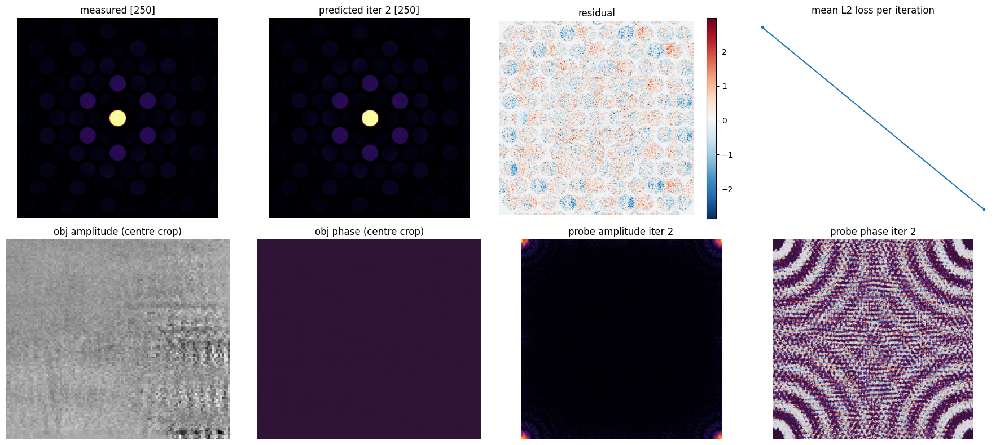

In [86]:
import torch
import numpy as np
import matplotlib.pyplot as plt

# ── 0. Raw inputs ─────────────────────────────────────────────────────────────
intensities_4d = pdset.intensities_4d                          # [n_rows, n_cols, H, W]
n_rows, n_cols = intensities_4d.shape[:2]
H, W           = intensities_4d.shape[2], intensities_4d.shape[3]
n_scan         = n_rows * n_cols

measured_amplitudes = torch.tensor(
    intensities_4d.reshape(n_scan, H, W), dtype=torch.float32
).sqrt()

probe = ptycho_pix.probe_model.probe[0].detach().clone()       # [H, W], complex

# ── 1. Build scan positions from the raster grid ──────────────────────────────
# step_r / step_c = how many pixels the beam moves between scan points.
# For ~70% overlap: step ≈ 0.3 * probe_size.
# Change these if you know the real calibrated step size.
step_r = 1
step_c = 1

print(step_r)

# Object canvas large enough to hold all shifted patches
obj_H = (n_rows - 1) * step_r + H
obj_W = (n_cols - 1) * step_c + W

print(obj_H)
obj   = torch.ones(int(obj_H), int(obj_W), dtype=torch.complex64)

# Scan positions as (row_offset, col_offset) pixel indices into obj
positions = [(r * step_r, c * step_c) for r in range(n_rows) for c in range(n_cols)]

print(f"Probe: {H}×{W}, step: {step_r}×{step_c} px")
print(f"Object canvas: {obj_H}×{obj_W}")
print(f"n_scan: {n_scan}")

# ── 2. Helpers ────────────────────────────────────────────────────────────────
EPS = 1e-8

def fourier_project(exit_wave, measured_amp_corner):
    """Replace Fourier amplitude with measured, keep predicted phase."""
    F      = torch.fft.fft2(exit_wave, norm="ortho")
    phase  = F / (F.abs() + EPS)
    return torch.fft.ifft2(measured_amp_corner * phase, norm="ortho"), F

# ── 3. Iterative ePIE with real position shifts ───────────────────────────────
alpha      = 1.0
beta       = 0.5
n_iter     = 2
log_every  = 1

loss_history = []

for it in range(n_iter):
    order      = torch.randperm(n_scan)   # random scan order per iteration
    iter_loss  = 0.0

    for k in order:
        k       = k.item()
        r0, c0  = positions[k]

        # Extract object patch
        obj_patch = obj[r0:r0+H, c0:c0+W]                    # [H, W]

        # Exit wave and Fourier projection
        exit_wave      = obj_patch * probe
        measured_corn  = torch.fft.ifftshift(measured_amplitudes[k])
        exit_new, F    = fourier_project(exit_wave, measured_corn)

        delta = exit_new - exit_wave                           # [H, W]

        # Object update (in-place on canvas patch)
        probe_max_sq = probe.abs().pow(2).max() + EPS
        obj[r0:r0+H, c0:c0+W] = obj_patch + alpha * probe.conj() / probe_max_sq * delta

        # Probe update
        patch_max_sq = obj_patch.abs().pow(2).max() + EPS
        probe        = probe + beta * obj_patch.conj() / patch_max_sq * delta

        # Loss for this scan point
        pred_amp   = torch.fft.fftshift(F).abs()
        iter_loss += ((measured_amplitudes[k] - pred_amp) ** 2).mean().item()

    loss_history.append(iter_loss / n_scan)
    if it % log_every == 0:
        print(f"iter {it+1:03d}/{n_iter}  loss: {loss_history[-1]:.4e}")

# ── 4. Visualise ──────────────────────────────────────────────────────────────
idx   = 250
r0, c0 = positions[idx]
exit_vis    = obj[r0:r0+H, c0:c0+W] * probe
F_vis       = torch.fft.fft2(exit_vis, norm="ortho")
pred_final  = torch.fft.fftshift(F_vis).abs().detach()

# Crop centre of object for display
cx, cy = obj_H // 2, obj_W // 2
pad    = max(H, W)
obj_crop = obj[cx-pad:cx+pad, cy-pad:cy+pad]

fig, axes = plt.subplots(2, 4, figsize=(18, 8))

axes[0,0].imshow(measured_amplitudes[idx].numpy(), cmap="inferno")
axes[0,0].set_title(f"measured [{idx}]")

axes[0,1].imshow(pred_final.numpy(), cmap="inferno")
axes[0,1].set_title(f"predicted iter {n_iter} [{idx}]")

diff = measured_amplitudes[idx] - pred_final
im   = axes[0,2].imshow(diff.numpy(), cmap="RdBu_r")
axes[0,2].set_title("residual")
plt.colorbar(im, ax=axes[0,2])

axes[0,3].plot(loss_history, marker="o", markersize=3)
axes[0,3].set_title("mean L2 loss per iteration")
axes[0,3].set_xlabel("iteration")

axes[1,0].imshow(obj_crop.abs().detach().numpy(), cmap="gray")
axes[1,0].set_title("obj amplitude (centre crop)")

axes[1,1].imshow(obj_crop.angle().detach().numpy(), cmap="twilight", vmin=-np.pi, vmax=np.pi)
axes[1,1].set_title("obj phase (centre crop)")

axes[1,2].imshow(probe.abs().detach().numpy(), cmap="inferno")
axes[1,2].set_title(f"probe amplitude iter {n_iter}")

axes[1,3].imshow(probe.angle().detach().numpy(), cmap="twilight", vmin=-np.pi, vmax=np.pi)
axes[1,3].set_title(f"probe phase iter {n_iter}")

for ax in axes.flat:
    ax.axis("off")
plt.tight_layout()
plt.show()

In [95]:
print((abs(probe[0])))

tensor([177.9942, 177.1538, 177.2792, 131.1028, 107.6655, 116.7383, 140.9100,
        128.6320,  99.5955,  75.0083,  46.1012,  30.5014,  31.2544,  34.2701,
         25.0470,   8.3482,   9.6019,  13.1890,  18.5605,  19.0965,  28.1585,
         24.1389,  21.4430,   8.6637,  11.4900,  12.5221,   8.7125,   7.5577,
          5.4564,  12.4940,   8.9687,  13.8386,  14.1663,  12.6855,  14.8282,
         17.2512,  13.4345,  14.9635,   9.8191,   6.7708,   2.4368,  13.7195,
          8.3066,  15.9626,  14.0340,  17.9887,  15.2713,  16.0397,  17.6512,
          8.4470,   5.0846,  10.2161,  10.1742,   5.1540,  19.7397,  13.7986,
         10.9815,  14.8148,  25.1076,  17.3922,  14.0179,   5.7657,  19.6159,
         19.0233,   9.1762,   8.6148,  12.1677,   3.4718,   3.6074,   5.5920,
         12.7038,  13.0568,   8.0852,  11.3180,   7.9295,   5.4422,  11.0399,
         11.6673,   9.2322,   9.8167,   5.3143,   4.7802,   7.1609,   5.1056,
          5.8461,   9.4355,   4.3816,  12.3382,   6.9245,   6.43

(<Figure size 400x400 with 1 Axes>, <Axes: >)

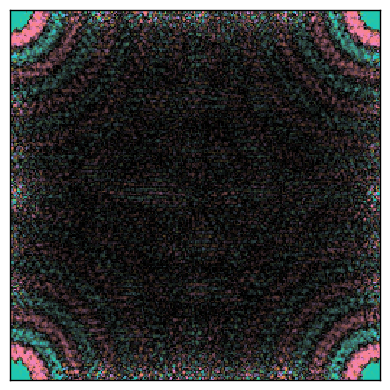

In [94]:
show_2d(probe)

(<Figure size 400x400 with 1 Axes>, <Axes: >)

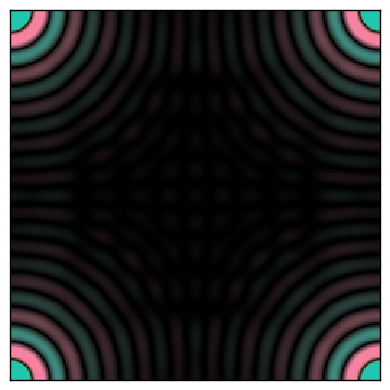

In [96]:
probe_clone = ptycho_pix.probe_model.probe[0].detach().clone()       # [H, W], complex
show_2d(probe_clone)

In [102]:
print((abs(probe_clone[0])))

tensor([1.8996e+02, 1.8838e+02, 1.8370e+02, 1.7608e+02, 1.6575e+02, 1.5307e+02,
        1.3843e+02, 1.2231e+02, 1.0520e+02, 8.7620e+01, 7.0086e+01, 5.3089e+01,
        3.7084e+01, 2.2475e+01, 9.6634e+00, 2.7046e+00, 1.0748e+01, 1.7423e+01,
        2.2012e+01, 2.4572e+01, 2.5265e+01, 2.4317e+01, 2.2003e+01, 1.8630e+01,
        1.4521e+01, 9.9998e+00, 5.3796e+00, 1.0234e+00, 3.1743e+00, 6.5841e+00,
        9.2563e+00, 1.1094e+01, 1.2065e+01, 1.2191e+01, 1.1540e+01, 1.0220e+01,
        8.3685e+00, 6.1433e+00, 3.7125e+00, 1.2498e+00, 1.1421e+00, 3.2359e+00,
        4.9745e+00, 6.2682e+00, 7.0674e+00, 7.3569e+00, 7.1539e+00, 6.5051e+00,
        5.4815e+00, 4.1731e+00, 2.6820e+00, 1.1168e+00, 4.3773e-01, 1.8416e+00,
        3.0439e+00, 3.9724e+00, 4.5829e+00, 4.8541e+00, 4.7879e+00, 4.4077e+00,
        3.7559e+00, 2.8902e+00, 1.8793e+00, 7.9864e-01, 2.8860e-01, 1.2849e+00,
        2.1472e+00, 2.8203e+00, 3.2677e+00, 3.4698e+00, 3.4243e+00, 3.1450e+00,
        2.6609e+00, 2.0133e+00, 1.2525e+

In [246]:
PROBE_ENERGY = 10e3 # eV
PROBE_SEMIANGLE = 20 # mrad
PROBE_DEFOCUS = 10 # A 

probe_params_2 = {
    "energy": PROBE_ENERGY,
    "defocus": PROBE_DEFOCUS,
    "semiangle_cutoff": PROBE_SEMIANGLE,
}

probe_model_pix_2 = ProbePixelated.from_params(
    probe_params=probe_params_2,
)

ptycho_pix_2 = Ptychography.from_models( 
    dset=pdset,
    obj_model=obj_model_pix,
    probe_model=probe_model_pix_2,
    detector_model=detector_model,
    logger=logger_pix,
    rng=42,
)

ptycho_pix_2.preprocess(
    obj_padding_px=(0, 0),
    val_ratio=0.0,
)

probe_clone_2 = ptycho_pix_2.probe_model.probe[0].detach().clone()       # [H, W], complex
obj_clone_2 = ptycho_pix_2.obj_model.obj[0].detach().clone()       # [H, W], complex



torch.Size([160, 80])
tensor([1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j,
        1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j,
        1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j,
        1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j,
        1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j,
        1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j,
        1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j, 1.+0.j])


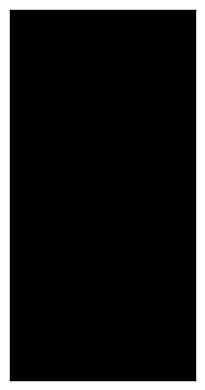

In [249]:
print(obj_clone_2.shape)
show_2d(obj_clone_2)
print(obj_clone_2[0])

tensor([ 6.0098e+04+9.5336e-11j,  5.9599e+04+6.2652e+01j,
         5.8118e+04+1.2219e+02j,  5.5705e+04+1.7568e+02j,
         5.2438e+04+2.2050e+02j,  4.8425e+04+2.5453e+02j,
         4.3794e+04+2.7623e+02j,  3.8693e+04+2.8473e+02j,
         3.3278e+04+2.7988e+02j,  2.7715e+04+2.6222e+02j,
         2.2165e+04+2.3302e+02j,  1.6784e+04+1.9410e+02j,
         1.1714e+04+1.4778e+02j,  7.0784e+03+9.6739e+01j,
         2.9791e+03+4.3846e+01j, -5.0733e+02-8.0033e+00j,
        -3.3317e+03-5.6044e+01j, -5.4725e+03-9.7811e+01j,
        -6.9355e+03-1.3125e+02j, -7.7518e+03-1.5485e+02j,
        -7.9752e+03-1.6770e+02j, -7.6784e+03-1.6954e+02j,
        -6.9489e+03-1.6074e+02j, -5.8839e+03-1.4229e+02j,
        -4.5857e+03-1.1572e+02j, -3.1562e+03-8.2969e+01j,
        -1.6932e+03-4.6290e+01j, -2.8513e+02-8.0980e+00j,
         9.9150e+02+2.9191e+01j,  2.0753e+03+6.3284e+01j,
         2.9215e+03+9.2167e+01j,  3.5032e+03+1.1420e+02j,
         3.8106e+03+1.2824e+02j,  3.8507e+03+1.3364e+02j,
         3.645

(<Figure size 400x400 with 1 Axes>, <Axes: >)

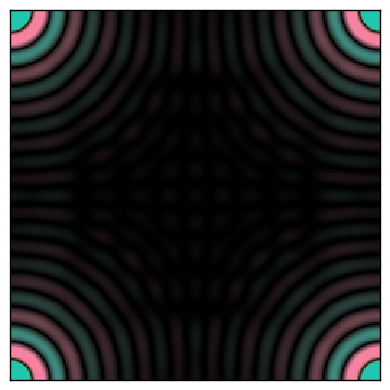

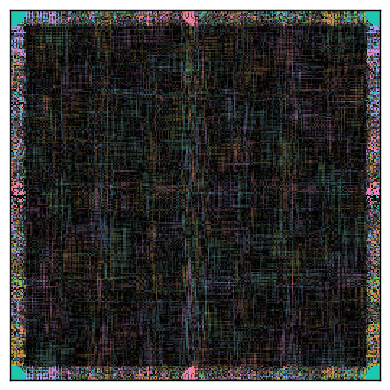

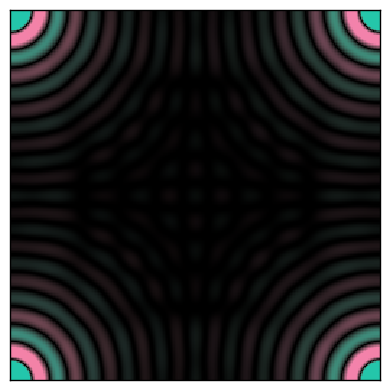

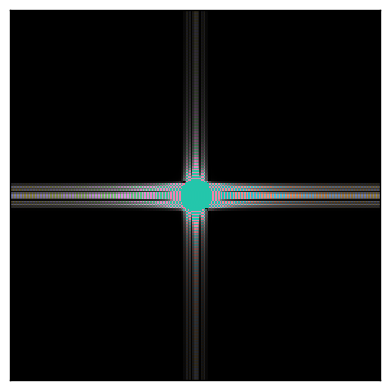

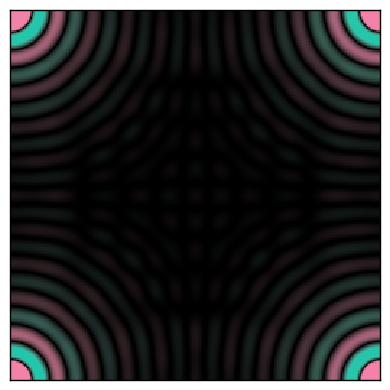

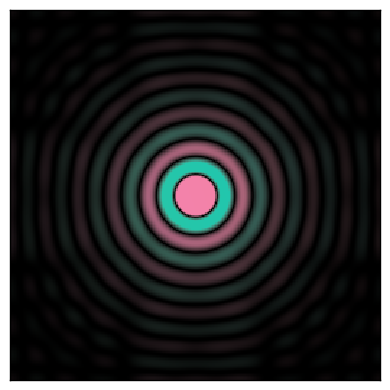

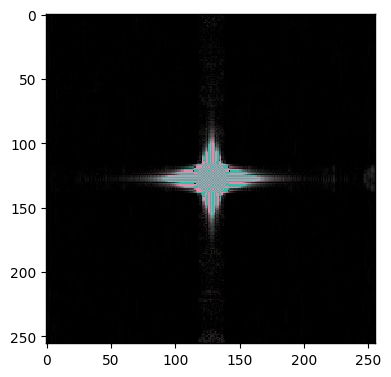

In [242]:
show_2d(probe_clone_2)
show_2d((torch.fft.fft2(probe_clone_2)))
show_2d(ptycho_pix_reconstruct[0,333])
show_2d(torch.fft.fftshift(torch.fft.fft2(ptycho_pix_reconstruct[0,333])))

show_2d(probe_clone_2 - ptycho_pix_reconstruct[0,333])
show_2d(torch.fft.fftshift(probe_clone_2 - ptycho_pix_reconstruct[0,333]))

print((ptycho_pix_reconstruct[0,333])[0])
print((probe_clone_2)[0])

print((ptycho_pix_reconstruct[0,333])[0]-(probe_clone_2)[0])


window = torch.hann_window(256)
window2d = window[:, None] * window[None, :]
show_2d(torch.fft.fftshift(torch.fft.fft2(torch.fft.fftshift(ptycho_pix_reconstruct[0, 333])*window2d)), show_ticks=True)


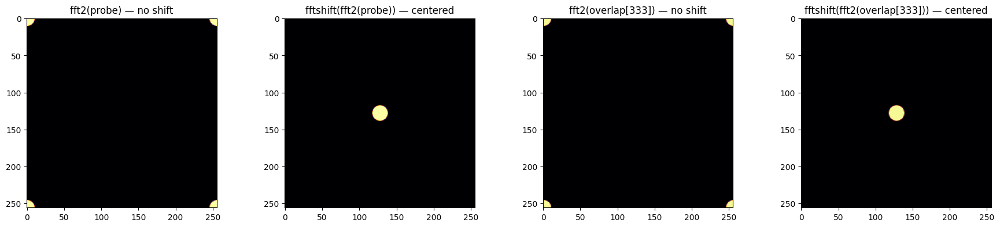

[1.6511042e-04 1.8513766e-03 8.0191763e-04 3.5613429e-04 6.2373496e-04
 1.2442041e-03 9.8788145e-04 1.9798679e-03 3.5498980e+04 3.5938578e+04
 3.5938578e+04 3.5938574e+04 3.5938574e+04 3.5938574e+04 3.5938570e+04
 3.5938578e+04 3.5938570e+04 3.5938578e+04 3.5938570e+04 3.5938570e+04
 3.5938566e+04 3.5938574e+04 3.5938578e+04 3.5938574e+04 3.5938570e+04
 3.5938574e+04 3.5938570e+04 3.5938570e+04 3.5498980e+04 1.4059482e-03
 5.7344977e-04 1.9966403e-03 5.2743859e-04 1.3830786e-03 7.8549673e-04
 4.3342719e-05]
[3.9577004e+04 4.4592664e+04 5.1308074e+04 6.0801914e+04 7.5293719e+04
 1.0020098e+05 1.5271628e+05 3.2512500e+05 1.0883008e+07 1.1499353e+07
 1.1285056e+07 1.1418289e+07 1.1326579e+07 1.1392577e+07 1.1344549e+07
 1.1378924e+07 1.1355669e+07 1.1369236e+07 1.1364547e+07 1.1360601e+07
 1.1373403e+07 1.1351034e+07 1.1384411e+07 1.1337664e+07 1.1401845e+07
 1.1312843e+07 1.1441460e+07 1.1237059e+07 1.1534797e+07 3.5891709e+05
 1.6000836e+05 1.0318957e+05 7.6898750e+04 6.1799691e+04 5.19

In [243]:
fig, axes = plt.subplots(1, 4, figsize=(18, 4))

axes[0].set_title("fft2(probe) — no shift")
axes[0].imshow(torch.fft.fft2(probe_clone_2).abs().detach().numpy(), cmap='inferno')

axes[1].set_title("fftshift(fft2(probe)) — centered")
axes[1].imshow(torch.fft.fftshift(torch.fft.fft2(probe_clone_2)).abs().detach().numpy(), cmap='inferno')

axes[2].set_title("fft2(overlap[333]) — no shift")  
axes[2].imshow(torch.fft.fft2(ptycho_pix_reconstruct[0,333]).abs().detach().numpy(), cmap='inferno')

axes[3].set_title("fftshift(fft2(overlap[333])) — centered")
axes[3].imshow(torch.fft.fftshift(torch.fft.fft2(ptycho_pix_reconstruct[0,333])).abs().detach().numpy(), cmap='inferno')

plt.tight_layout(); plt.show()

print(torch.fft.fftshift(torch.fft.fft2(probe_clone_2)).abs().detach().numpy()[128, 110:146])
print(torch.fft.fftshift(torch.fft.fft2(ptycho_pix_reconstruct[0,333])).abs().detach().numpy()[128, 110:146])

  0%|          | 0/2 [00:00<?, ?it/s]

patch indices: tensor([[[  257,   258,   259,  ...,   254,   255,   256],
         [  337,   338,   339,  ...,   334,   335,   336],
         [  417,   418,   419,  ...,   414,   415,   416],
         ...,
         [   17,    18,    19,  ...,    14,    15,    16],
         [   97,    98,    99,  ...,    94,    95,    96],
         [  177,   178,   179,  ...,   174,   175,   176]],

        [[11510, 11511, 11512,  ..., 11507, 11508, 11509],
         [11590, 11591, 11592,  ..., 11587, 11588, 11589],
         [11670, 11671, 11672,  ..., 11667, 11668, 11669],
         ...,
         [11270, 11271, 11272,  ..., 11267, 11268, 11269],
         [11350, 11351, 11352,  ..., 11347, 11348, 11349],
         [11430, 11431, 11432,  ..., 11427, 11428, 11429]],

        [[ 1373,  1374,  1375,  ...,  1370,  1371,  1372],
         [ 1453,  1454,  1455,  ...,  1450,  1451,  1452],
         [ 1533,  1534,  1535,  ...,  1530,  1531,  1532],
         ...,
         [ 1133,  1134,  1135,  ...,  1130,  1131,  11

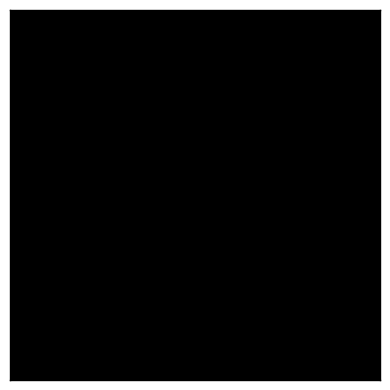

patch shape: torch.Size([1, 1225, 256, 256])
probe shape: torch.Size([1, 1225, 256, 256])
overlap shape: torch.Size([1, 1225, 256, 256])
obj full shape: torch.Size([1, 160, 80])
probe full shape: torch.Size([1, 256, 256])
first overlap
<class 'torch.Tensor'>
torch.Size([1, 1225, 256, 256])
torch.complex64
tensor(189.9608, grad_fn=<MaxBackward1>)


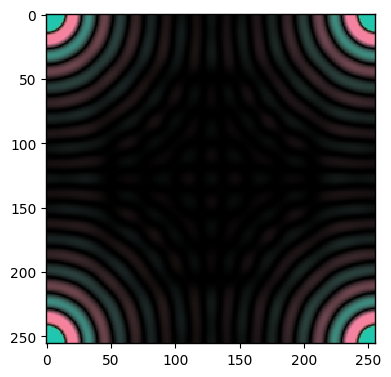

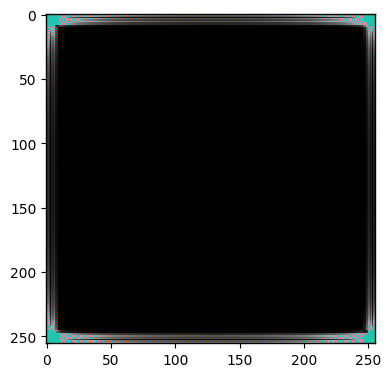

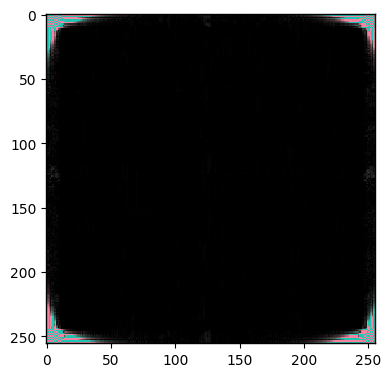

windowed
tensor([3.5939e+04, 3.5939e+04, 3.5938e+04, 3.5939e+04, 3.5937e+04, 3.5940e+04,
        3.5934e+04, 3.5944e+04, 3.5918e+04, 3.5723e+04, 2.6976e+04, 9.3410e+03,
        1.1224e+02, 2.3994e+01, 8.7707e+00, 4.1353e+00, 2.2696e+00, 1.3784e+00,
        9.0091e-01, 6.2109e-01, 4.4693e-01, 3.3252e-01, 2.5514e-01, 1.9967e-01,
        1.5936e-01, 1.2935e-01, 1.0627e-01, 9.1046e-02, 7.3427e-02, 6.5705e-02,
        5.5109e-02, 4.7956e-02, 4.1845e-02, 3.6716e-02, 3.2061e-02, 2.9729e-02,
        2.5464e-02, 2.3764e-02, 2.0801e-02, 1.9227e-02, 1.6262e-02, 1.6183e-02,
        1.3688e-02, 1.3666e-02, 1.2021e-02, 1.1382e-02, 9.8129e-03, 9.8720e-03,
        8.6591e-03, 7.4580e-03, 8.1908e-03, 6.5169e-03, 6.7733e-03, 6.4134e-03,
        4.3059e-03, 6.5982e-03, 5.3388e-03, 4.0254e-03, 4.9063e-03, 3.6850e-03,
        4.8076e-03, 3.7339e-03, 2.8240e-03, 4.2264e-03, 2.5818e-03, 3.9533e-03,
        1.7827e-03, 3.4580e-03, 2.5887e-03, 2.8420e-03, 1.3462e-03, 3.1997e-03,
        2.3271e-03, 2.9784e-03,

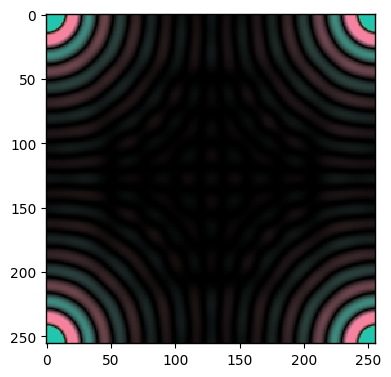

reconstruct: tensor([[[[189.3560+9.8032j, 186.7306+9.8217j, 181.0526+9.6174j,
            ..., 178.5625+8.4831j, 185.2035+9.1187j,
           188.8414+9.5651j],
          [188.8349+9.6916j, 186.2145+9.7109j, 180.5471+9.5092j,
            ..., 178.0612+8.3789j, 184.6900+9.0104j,
           188.3212+9.4543j],
          [185.1911+9.3668j, 182.6050+9.3860j, 177.0118+9.1885j,
            ..., 174.5574+8.0807j, 181.0997+8.6992j,
           184.6839+9.1341j],
          ...,
          [172.5279+8.8490j, 170.0615+8.8591j, 164.7281+8.6583j,
            ..., 162.3876+7.6199j, 168.6257+8.2150j,
           172.0439+8.6308j],
          [181.0654+9.3748j, 178.5180+9.3886j, 173.0091+9.1847j,
            ..., 170.5927+8.0971j, 177.0359+8.7143j,
           180.5659+9.1464j],
          [186.7372+9.6966j, 184.1364+9.7132j, 178.5117+9.5082j,
            ..., 176.0450+8.3882j, 182.6236+9.0190j,
           186.2274+9.4615j]],

         [[189.5311+9.8153j, 187.9477+9.9090j, 183.2712+9.7788j,
            ..., 

AttributeError: 'Tensor' object has no attribute 'visualize'

In [ ]:
opt_params = {
        "object": {
            "type": "adamw", 
            "lr": 1e-1, 
        },
        "probe": {
            "type": "adamw", 
            "lr": 1e-5, 
        },
        "dataset": { ### for optimizing over descan shifts and probe positions
            "type": "adamw",
            "lr": 1e-1,
        }
}

scheduler_params = {
    "object": { ## scheduler kwargs are passed to the scheduler (of type type)
        "type": "plateau", ## i like plateau for many cases
        "factor":0.2,

    },
    "probe": {
        "type": "plateau",
        "factor":0.2,

    },
    "dataset": { 
        "type": "plateau",  ## exp is also frequently used 
        "factor":0.2,

    }
}

constraints = {
    "object": {
        "identical_slices": True,
        "positivity": True,
        "fix_potential_baseline": True,
        "fix_potential_baseline_factor": 0.1,  # tune between 0.05–0.5
        "gaussian_sigma": 0.3,      # was "gaussian_filter_sigma" + "gaussian_filter"
        "tv_weight_xy": 0.01,       # was "tv_denoise_weight" + "tv_denoise"
        # optionally also:
        # "q_lowpass": 0.3,         # low-pass frequency cutoff (0–1)
    },
    "dataset": {
        "center_scan_positions": True,
    }
}

constraints_stage1 = {
    "object": {
        "gaussian_sigma": 2.0,      # very heavy
        "fix_potential_baseline": True,
        "fix_potential_baseline_factor": 0.5,
        "positivity": True,
    }
}
constraints_stage2 = {
    "object": {
        # "gaussian_sigma": 0.3,
        # "tv_weight_xy": 0.005,
        # "fix_potential_baseline": True,
        # "fix_potential_baseline_factor": 0.1,
        # "positivity": True,
    }
}
# ptycho_pix_reconstruct = ptycho_pix.reconstruct(
#     num_iters=20,
#     reset=True,
#     optimizer_params=opt_params,
#     scheduler_params=scheduler_params,
#     constraints=constraints_stage1, 
#     batch_size=128,
#     device="cuda:1",
#     store_snapshots_every=1,
#     autograd=False,
#     autograd_random=False,
# )
ptycho_pix_reconstruct = ptycho_pix.reconstruct(
    num_iters=2,
    reset=True,
    optimizer_params=opt_params,
    scheduler_params=scheduler_params,
    constraints=constraints_stage2, 
    batch_size=2500,
    device="cpu",
    store_snapshots_every=1,
    autograd=False,
    autograd_random=False,
    disk_phase='mean'
)

print(f'reconstruct: {ptycho_pix_reconstruct}')

ptycho_pix_reconstruct.visualize()

em.visualization.show_2d(
    [
        [
            np.rot90(np.angle(ptycho_pix_reconstruct.obj[0]),k=1),
        ],
    ],
    title=[
        ["iterative ptychography phase"],
    ],
    axsize=(5,5),
    cbar=True,
    show_ticks=True
);



In [154]:
# print((abs(probe_clone_2[0])))
print(abs(torch.fft.fft2(probe_clone_2)[0]))

tensor([3.5939e+04, 3.5939e+04, 3.5939e+04, 3.5939e+04, 3.5939e+04, 3.5939e+04,
        3.5939e+04, 3.5939e+04, 3.5939e+04, 3.5939e+04, 3.5499e+04, 1.4059e-03,
        5.7345e-04, 1.9966e-03, 5.2744e-04, 1.3831e-03, 7.8550e-04, 4.3343e-05,
        1.1259e-03, 1.2873e-03, 6.5688e-04, 1.3633e-03, 5.1400e-04, 6.3612e-04,
        1.3097e-03, 7.0968e-04, 3.2283e-04, 2.2585e-03, 9.9444e-04, 2.1634e-03,
        4.0976e-04, 4.8796e-04, 3.8267e-04, 1.2636e-03, 5.1542e-04, 1.3942e-03,
        3.9885e-04, 8.4181e-04, 1.1321e-03, 3.7868e-04, 1.5359e-03, 7.0598e-04,
        1.4316e-04, 1.2423e-03, 5.6095e-04, 3.8189e-04, 7.4347e-04, 6.2504e-04,
        3.4589e-04, 6.1592e-04, 4.2801e-04, 4.6543e-04, 1.4026e-04, 6.7392e-04,
        1.2272e-03, 1.7981e-03, 2.1037e-04, 5.5188e-04, 9.7626e-04, 1.2593e-03,
        1.5746e-04, 4.7504e-04, 1.4795e-03, 1.0651e-03, 6.6072e-04, 2.9907e-04,
        8.6926e-04, 3.2978e-04, 4.7869e-04, 6.4674e-04, 9.7882e-04, 4.2929e-04,
        6.5066e-04, 6.1519e-04, 8.5751e-

amplitude max diff: 4.5776e-05
phase max diff:     6.2810e+00


AttributeError: AxesImage.set() got an unexpected keyword argument 'colorbar'

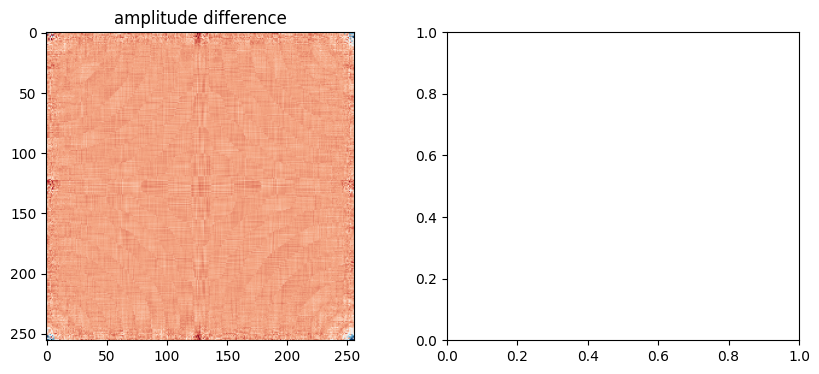